In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/31973.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/30778.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/19812.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/22735.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/38246.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/16916.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/52876.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39500.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44758.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/59454.jpg
/kaggle/input/fashion-product-images-dataset/fashion-dataset/images/44951.jp

In [2]:
image_df = pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images.csv')
image_df.head()

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...


In [3]:
styles_df = pd.read_csv('/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv', on_bad_lines='skip')
styles_df.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt


In [4]:
print(f"Dataset Shape: {styles_df.shape}")
print(f"Memory Usage:{styles_df.memory_usage(deep=True).sum()/1024**2:.2f} MB")

Dataset Shape: (44424, 10)
Memory Usage:23.32 MB


## DATA TYPE ANALYSIS

In [5]:
print("Column Data Types:")
dtype_df = pd.DataFrame({
    'Data Type': styles_df.dtypes.values,
    'Non-Null Count:': styles_df.count(),
    'Null Count': styles_df.isnull().sum()
})
dtype_df = dtype_df.reset_index().rename(columns={'index': 'Column'})
display(dtype_df)

Column Data Types:


,Column,Data Type,Non-Null Count:,Null Count
0,id,int64,44424,0
1,gender,object,44424,0
2,masterCategory,object,44424,0
3,subCategory,object,44424,0
4,articleType,object,44424,0
5,baseColour,object,44409,15
6,season,object,44403,21
7,year,float64,44423,1
8,usage,object,44107,317
9,productDisplayName,object,44417,7


## MISSING VALUES ANALYSIS

In [6]:
missing_total = styles_df.isnull().sum()
missing_pct = (missing_total/len(styles_df))*100
missing_df = pd.DataFrame({
    'Column': styles_df.columns,
    'Missing_Count': missing_total.values,
    'Missing_Percentage': missing_pct.values
}).sort_values('Missing_Count', ascending=False)

display(missing_df)

,Column,Missing_Count,Missing_Percentage
8,usage,317,0.713578
6,season,21,0.047272
5,baseColour,15,0.033766
9,productDisplayName,7,0.015757
7,year,1,0.002251
0,id,0,0.000000
1,gender,0,0.000000
4,articleType,0,0.000000
2,masterCategory,0,0.000000
3,subCategory,0,0.000000


In [7]:
season_mode = styles_df.groupby(['gender', 'masterCategory', 'articleType'])['season'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
styles_df['season'] = styles_df.apply(
    lambda row: season_mode.get((row['gender'], row['masterCategory'], row['articleType']), row['season']) if pd.isna(row['season']) else row['season'],
    axis=1
)
base_colour_mode = styles_df.groupby(['gender', 'masterCategory', 'articleType'])['baseColour'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
styles_df['baseColour'] = styles_df.apply(
    lambda row: base_colour_mode.get((row['gender'], row['masterCategory'], row['articleType']), row['baseColour']) if pd.isna(row['baseColour']) else row['baseColour'],
    axis=1
)
usage_mode = styles_df.groupby(['gender', 'masterCategory', 'articleType'])['usage'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
styles_df['usage'] = styles_df.apply(
    lambda row: usage_mode.get((row['gender'], row['masterCategory'], row['articleType']), row['usage']) if pd.isna(row['usage']) else row['usage'],
    axis=1
)


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

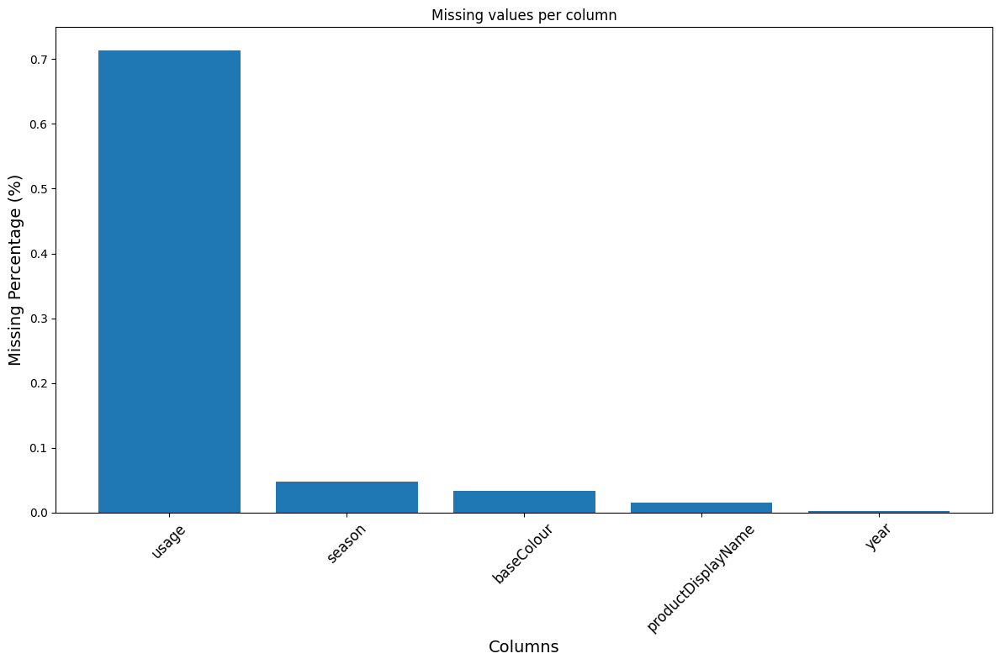

In [9]:
plt.figure(figsize=(12,8))
missing_data = missing_df[missing_df['Missing_Count'] > 0]
plt.bar(missing_data['Column'], missing_data['Missing_Percentage'])
plt.title('Missing values per column')
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Missing Percentage (%)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()

## UNIQUE VALUE ANALYSIS

In [10]:
distinct_summary = []
for col in styles_df.columns:
    distinct_cnt = styles_df[col].nunique()
    distinct_pct = (distinct_cnt/len(styles_df))*100
    distinct_summary.append({
        'Column': col,
        'Distinct_Count': distinct_cnt,
        'Distinct_Percentage': distinct_pct
    })

distinct_df = pd.DataFrame(distinct_summary).sort_values('Distinct_Count', ascending=False)
display(distinct_df)

,Column,Distinct_Count,Distinct_Percentage
0,id,44424,100.000000
9,productDisplayName,31121,70.054475
4,articleType,143,0.321898
5,baseColour,46,0.103548
3,subCategory,45,0.101297
7,year,13,0.029263
8,usage,8,0.018008
2,masterCategory,7,0.015757
1,gender,5,0.011255
6,season,4,0.009004


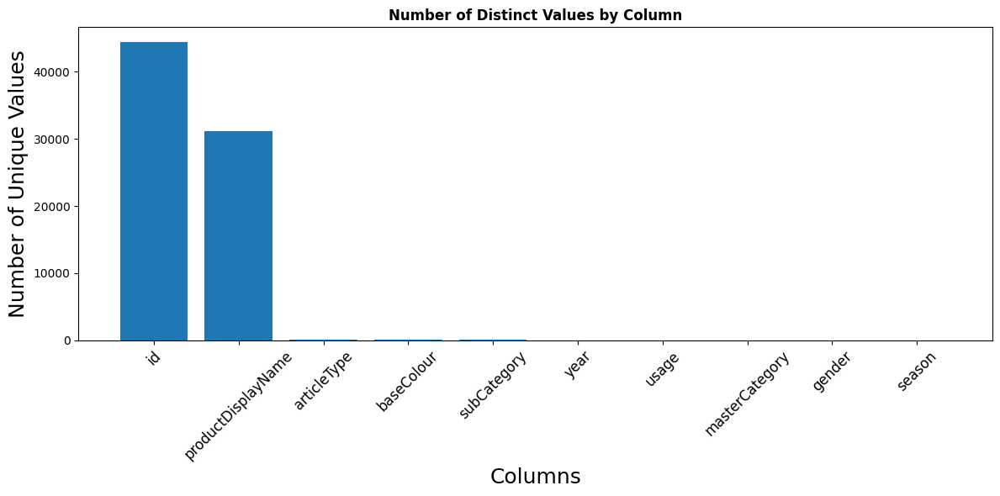

In [11]:
plt.figure(figsize=(12, 6))
plt.bar(distinct_df['Column'], distinct_df['Distinct_Count'])
plt.title('Number of Distinct Values by Column', fontweight='bold' )
plt.xlabel('Columns', fontsize=18)
plt.ylabel('Number of Unique Values', fontsize=18)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()

## TARGET FEATURES ANALYSIS

In [12]:
styles_df.dtypes

id                      int64
gender                 object
masterCategory         object
subCategory            object
articleType            object
baseColour             object
season                 object
year                  float64
usage                  object
productDisplayName     object
dtype: object

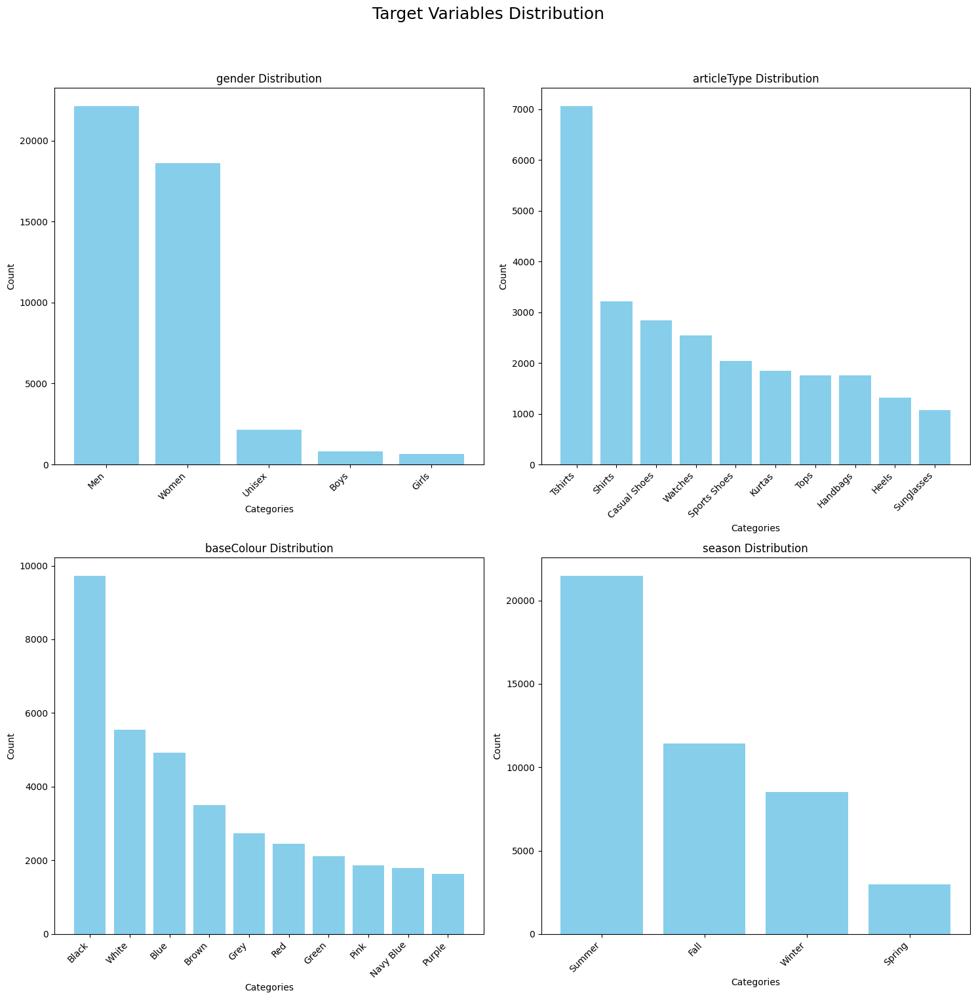

In [13]:
target_variables = ['gender','articleType', 'baseColour', 'season']

fig, axes = plt.subplots(2, 2, figsize=(15, 16))
fig.suptitle('Target Variables Distribution', fontsize=18)

axes = axes.flatten()

for i, target in enumerate(target_variables):
    if target in styles_df.columns:
        value_counts = styles_df[target].value_counts()
        top_categories = value_counts.head(10)

        axes[i].bar(range(len(top_categories)), top_categories.values, color='skyblue')
        axes[i].set_title(f'{target} Distribution')
        axes[i].set_xlabel('Categories')
        axes[i].set_ylabel('Count')

        axes[i].set_xticks(range(len(top_categories)))
        axes[i].set_xticklabels(top_categories.index, rotation=45, ha='right')
    else:
        axes[i].axis('off')  # Hide unused plots if column missing

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit suptitle
plt.show()


## Cross-Variable Correlation Analaysis

In [14]:
from scipy.stats import chi2_contingency, chi2
from scipy.stats import contingency
from sklearn.preprocessing import LabelEncoder
from itertools import combinations, permutations

CRAMER'S V CORRELATION

In [15]:
def cramers_v(x,y):
    confusion_matrix = pd.crosstab(x,y)
    chi2_stat = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2_stat/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2) / (n-1)
    kcorr = k-((k-1)**2) / (n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

In [16]:
cramers_matrix = np.zeros((len(target_variables), len(target_variables)))


In [17]:
for i, var1 in enumerate(target_variables):
    for j, var2 in enumerate(target_variables):
        if i==j:
            cramers_matrix[i,j] = 1.0
        else:
            cramers_matrix[i,j] = cramers_v(styles_df[var1], styles_df[var2])
            

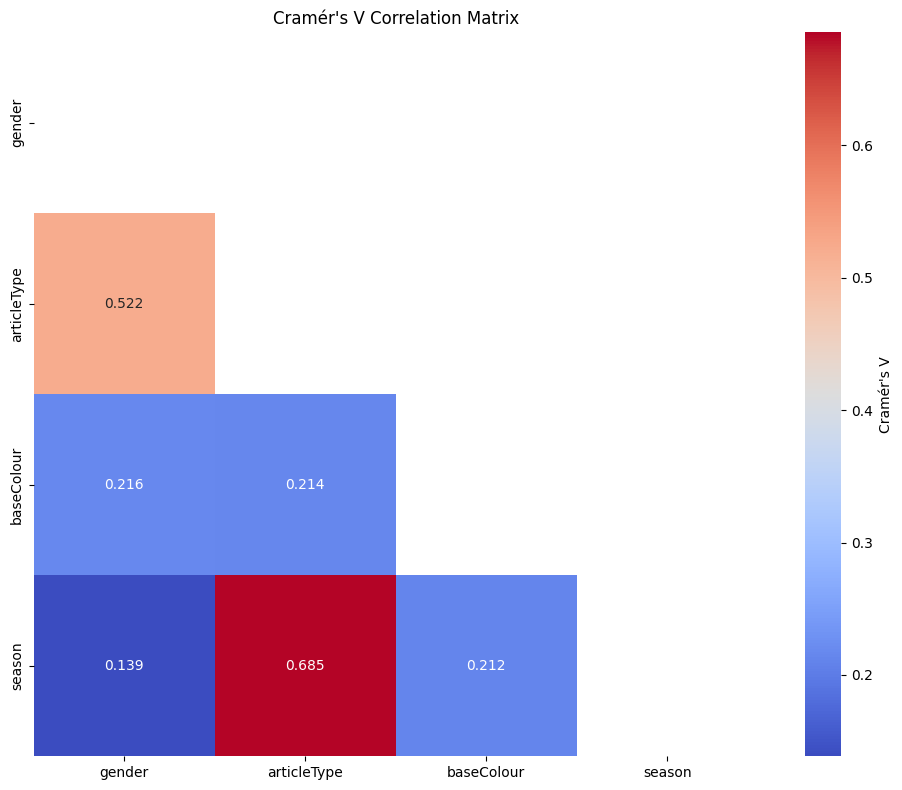

In [18]:
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(cramers_matrix, dtype=bool))
sns.heatmap(cramers_matrix,
            annot=True,
            fmt='.3f',
            cmap='coolwarm',
            square=True,
            xticklabels=target_variables,
            yticklabels=target_variables,
            mask=mask,
            cbar_kws={'label': "Cramér's V"})
plt.title("Cramér's V Correlation Matrix")
plt.tight_layout()
plt.show()

Chi-Square Independence Test

In [19]:
chi2_results = []
for var1, var2 in combinations(target_variables, 2):
    contingency_table = pd.crosstab(styles_df[var1], styles_df[var2])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
    
    n = contingency_table.sum().sum()
    cramers_v_val = cramers_v(styles_df[var1], styles_df[var2])
    
    chi2_results.append({
        'Variable_1': var1,
        'Variable_2': var2,
        'Chi2_Statistic': chi2_stat,
        'P_Value': p_value,
        'Degrees_of_Freedom': dof,
        'Cramers_V': cramers_v_val,
        'Association_Strength': (
            'Strong' if cramers_v_val > 0.5 else
            'Medium' if cramers_v_val > 0.3 else
            'Weak' if cramers_v_val > 0.1 else
            'Very Weak'
        ),
        'Significant': 'Yes' if p_value < 0.05 else 'No'
    })

chi2_df = pd.DataFrame(chi2_results)
display(chi2_df.round(4))

,Variable_1,Variable_2,Chi2_Statistic,P_Value,Degrees_of_Freedom,Cramers_V,Association_Strength,Significant
0,gender,articleType,48981.8262,0.0,568,0.5220,Strong,Yes
1,gender,baseColour,8455.5071,0.0,180,0.2158,Weak,Yes
2,gender,season,2572.5040,0.0,12,0.1386,Weak,Yes
3,articleType,baseColour,97810.0924,0.0,6390,0.2140,Weak,Yes
4,articleType,season,63002.3978,0.0,426,0.6853,Strong,Yes
5,baseColour,season,6112.3834,0.0,135,0.2118,Weak,Yes


In [20]:
image_df.head()

,filename,link
0,15970.jpg,http://assets.myntassets.com/v1/images/style/p...
1,39386.jpg,http://assets.myntassets.com/v1/images/style/p...
2,59263.jpg,http://assets.myntassets.com/v1/images/style/p...
3,21379.jpg,http://assets.myntassets.com/v1/images/style/p...
4,53759.jpg,http://assets.myntassets.com/v1/images/style/p...


## IMAGE DATA QUALITY ANALYSIS

In [21]:
from PIL import Image
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from pathlib import Path
from tqdm import tqdm

In [22]:
image_dir = Path('/kaggle/input/fashion-product-images-dataset/fashion-dataset/images')

In [23]:
class FashionDataset(Dataset):
    def __init__(self, image_ids, image_dir):
        self.image_ids = image_ids
        self.image_dir = image_dir
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor()
        ])
    
    def __len__(self):
        return len(self.image_ids)
    
    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        img_path = self.image_dir / f"{image_id}.jpg"
        
        try:
            img = Image.open(img_path).convert('RGB')
            original_size = img.size
            img_tensor = self.transform(img)
            return img_tensor, image_id, original_size
        except:
            # Return zeros for failed images
            return torch.zeros(3, 224, 224), image_id, (0, 0)

In [24]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [25]:
image_ids = styles_df['id'].tolist()
dataset = FashionDataset(image_ids, image_dir)
dataloader = DataLoader(dataset, batch_size=128, shuffle=False, num_workers=0)

In [26]:
results = []

In [27]:
print(f"Processing {len(image_ids)} images...")
for batch_data in tqdm(dataloader, desc="Processing images"):
    batch_tensors, batch_ids, batch_sizes = batch_data
    batch_tensors = batch_tensors.to(device)
    
    for i in range(len(batch_ids)):
        img_tensor = batch_tensors[i]
        img_id = batch_ids[i]
        width, height = batch_sizes[0][i].item(), batch_sizes[1][i].item()
        
        if width == 0 or height == 0:
            continue
            
        brightness = torch.mean(img_tensor).item()
        contrast = torch.std(img_tensor).item()
        
        gray = torch.mean(img_tensor, dim=0)
        grad_x = torch.diff(gray, dim=1)
        grad_y = torch.diff(gray, dim=0)
        blur_score = torch.var(grad_x).item() + torch.var(grad_y).item()
        
        results.append({
            'id': img_id,
            'width': width,
            'height': height,
            'brightness': brightness,
            'contrast': contrast,
            'blur_score': blur_score
        })


Processing 44424 images...


Processing images: 100%|██████████| 348/348 [34:43<00:00,  5.99s/it]


In [28]:
image_stats_df = pd.DataFrame(results)

In [29]:
print("\nImage Quality Statistics:")
print(f"Brightness: {image_stats_df['brightness'].mean():.3f} ± {image_stats_df['brightness'].std():.3f}")
print(f"Contrast: {image_stats_df['contrast'].mean():.3f} ± {image_stats_df['contrast'].std():.3f}")
print(f"Blur Score: {image_stats_df['blur_score'].mean():.3f} ± {image_stats_df['blur_score'].std():.3f}")


Image Quality Statistics:
Brightness: 0.842 ± 0.086
Contrast: 0.254 ± 0.082
Blur Score: 0.005 ± 0.003


In [30]:
low_quality = image_stats_df[
    (image_stats_df['brightness'] < 0.1) |  # Too dark
    (image_stats_df['contrast'] < 0.05) |   # Low contrast
    (image_stats_df['blur_score'] > 0.001)   # Blurry
]

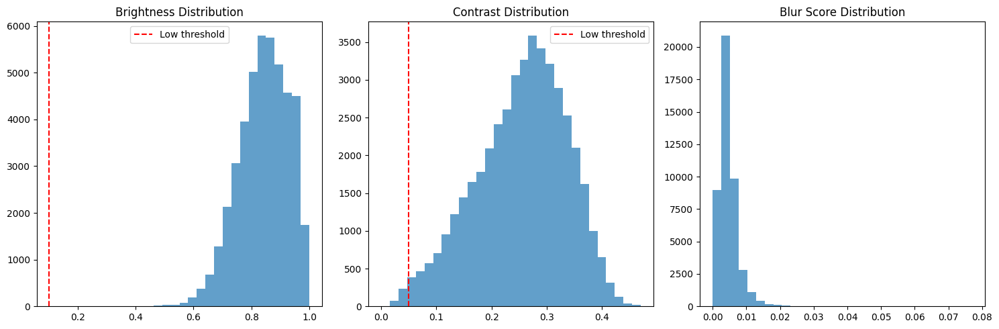

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].hist(image_stats_df['brightness'], bins=30, alpha=0.7)
axes[0].set_title('Brightness Distribution')
axes[0].axvline(x=0.1, color='red', linestyle='--', label='Low threshold')
axes[0].legend()

axes[1].hist(image_stats_df['contrast'], bins=30, alpha=0.7)
axes[1].set_title('Contrast Distribution')
axes[1].axvline(x=0.05, color='red', linestyle='--', label='Low threshold')
axes[1].legend()

axes[2].hist(image_stats_df['blur_score'], bins=30, alpha=0.7)
axes[2].set_title('Blur Score Distribution')

plt.tight_layout()
plt.show()

In [32]:
image_stats_df.to_csv('image_quality_results.csv', index=False)

## BASELINE ACCURACY METRICS

In [33]:
for col in target_variables:
    value_counts = styles_df[col].value_counts(normalize=True)
    most_common = value_counts.idxmax()
    baseline_accuracy = value_counts.max()
    print(f"Most common class: {most_common}")
    print(f"Baseline Accuracy: {baseline_accuracy:.4f}")

Most common class: Men
Baseline Accuracy: 0.4985
Most common class: Tshirts
Baseline Accuracy: 0.1591
Most common class: Black
Baseline Accuracy: 0.2191
Most common class: Summer
Baseline Accuracy: 0.4838


# MODEL TRAINING

In [34]:
target_columns = ['gender', 'articleType', 'baseColour', 'season']
class_mappings = {}

for col in target_columns:
    unique_classes = sorted(styles_df[col].dropna().unique())
    class_to_idx = {cls: idx for idx, cls in enumerate(unique_classes)}
    class_mappings[col] = class_to_idx


In [35]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(styles_df, test_size=0.2, stratify=styles_df['gender'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['gender'], random_state=42)

In [36]:
from sklearn.utils.class_weight import compute_class_weight

def compute_class_weights(df, class_mappings, target_columns, device):
    class_weights = {}

    for col in target_columns:
        # Map column values to their corresponding class indices
        labels = df[col].map(class_mappings[col])
        labels = labels.dropna().astype(int)

        # Compute weights only for present classes
        present_classes = np.unique(labels)
        weights_array = compute_class_weight(class_weight='balanced', classes=present_classes, y=labels)

        # Create a full weight tensor, default 1.0
        full_weights = np.ones(len(class_mappings[col]), dtype=np.float32)

        # Fill weights for present classes
        for cls, w in zip(present_classes, weights_array):
            full_weights[cls] = w

        class_weights[col] = torch.tensor(full_weights, dtype=torch.float32).to(device)

        print(f"[{col}] Class Weights: {full_weights.tolist()}")

    return class_weights


In [37]:
class_weights = compute_class_weights(train_df, class_mappings, target_columns, device)

[gender] Class Weights: [10.70451831817627, 13.56450366973877, 0.4011853039264679, 4.110931396484375, 0.4768735468387604]
[articleType] Class Weights: [3.095731735229492, 16.9233341217041, 0.4354202449321747, 4.094354629516602, 23.077272415161133, 19.52692222595215, 84.61666870117188, 0.3771916925907135, 36.264286041259766, 42.30833435058594, 253.85000610351562, 25.385000228881836, 5.5184783935546875, 0.678743302822113, 4.302542209625244, 0.3972613513469696, 7.252857208251953, 1.775174856185913, 1.1133772134780884, 0.11434684693813324, 11.538636207580566, 42.30833435058594, 1.075635552406311, 6.680263042449951, 25.385000228881836, 2.917816162109375, 253.85000610351562, 0.8969964385032654, 0.6697888970375061, 3.678985595703125, 2.789560556411743, 0.7786809802055359, 63.462501525878906, 7.252857208251953, 5.288541793823242, 84.61666870117188, 126.92500305175781, 11.036956787109375, 0.6176398992538452, 0.3482167422771454, 42.30833435058594, 0.5066866278648376, 4.533035755157471, 6.0440478

In [38]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                         std=[0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [39]:
class FashionDataset(Dataset):
    def __init__(self, df, image_dir, class_mappings, transform=None):
        self.df = df.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.class_mappings = class_mappings  # Pass the mappings dictionary

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img_path = self.image_dir / f"{row['id']}.jpg"
        try:
            image = Image.open(img_path).convert('RGB')
        except FileNotFoundError:
            print(f"[Warning] Missing image: {img_path}, using blank image instead.")
            # Return a blank RGB image (same size as input, e.g., 224x224)
            image = Image.new('RGB', (224, 224), (255, 255, 255))

        if self.transform:
            image = self.transform(image)

        gender_idx = self.class_mappings['gender'][row['gender']]
        article_idx = self.class_mappings['articleType'][row['articleType']]
        colour_idx = self.class_mappings['baseColour'][row['baseColour']]
        season_idx = self.class_mappings['season'][row['season']]

        return image, (gender_idx, article_idx, colour_idx, season_idx)


In [40]:
train_dataset = FashionDataset(train_df, image_dir, transform=train_transforms, class_mappings=class_mappings)
val_dataset = FashionDataset(val_df, image_dir, transform=val_test_transforms, class_mappings=class_mappings)
test_dataset = FashionDataset(test_df, image_dir, transform=val_test_transforms, class_mappings=class_mappings)

In [41]:
from torch.utils.data import DataLoader

batch_size = 128

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)


In [42]:
import torch
import torch.nn as nn
from torchvision import models
from torchvision.models import resnet18, ResNet18_Weights

class FashionModel(nn.Module):
    def __init__(self, num_genders, num_article_types, num_base_colours, num_seasons):
        super(FashionModel, self).__init__()

        self.backbone = resnet18(weights=ResNet18_Weights.DEFAULT)
        num_features = self.backbone.fc.in_features
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-1])

        self.gender_head = nn.Linear(num_features, num_genders)
        self.article_type_head = nn.Linear(num_features, num_article_types)
        self.season_head = nn.Linear(num_features, num_seasons)
        self.base_colour_head = nn.Linear(num_features, num_base_colours)
        
    def forward(self, x):
        features = self.backbone(x).squeeze()
        gender_out = self.gender_head(features)
        article_out = self.article_type_head(features)
        base_colour_out = self.base_colour_head(features)
        season_out = self.season_head(features)

        return gender_out, article_out, base_colour_out, season_out

In [43]:
gender_loss_fn = nn.CrossEntropyLoss(weight=class_weights['gender']).to(device)
article_loss_fn = nn.CrossEntropyLoss(weight=class_weights['articleType']).to(device)
base_colour_loss_fn = nn.CrossEntropyLoss(weight=class_weights['baseColour']).to(device)
season_loss_fn = nn.CrossEntropyLoss(weight=class_weights['season']).to(device)

In [44]:
model = FashionModel(
    num_genders=len(class_mappings['gender']),
    num_article_types=len(class_mappings['articleType']),
    num_base_colours=len(class_mappings['baseColour']),
    num_seasons=len(class_mappings['season'])
).to(device)

# GPU-specific optimizations
if torch.cuda.is_available():
    model = torch.nn.DataParallel(model)  # Use multiple GPUs if available
    torch.backends.cudnn.benchmark = True  # Optimize for consistent input sizes

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 159MB/s]


In [45]:
from torch.optim import Adam

optimizer = Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)
scaler = torch.amp.GradScaler() if torch.cuda.is_available() else None

In [46]:
def compute_accuracy(preds, labels):
    _, preds_max = torch.max(preds, dim=1)
    return (preds_max == labels).float().mean().item()

In [47]:
def train_one_epoch(model, loader, loss_fns, optimizer, device, scaler=None):
    model.train()
    total_loss = 0
    total_acc = {'gender': 0, 'articleType': 0, 'baseColour': 0, 'season': 0}

    for images, (gender_labels, article_labels, colour_labels, season_labels) in loader:
        # Non-blocking transfer for faster GPU loading
        images = images.to(device, non_blocking=True)
        gender_labels = gender_labels.to(device, non_blocking=True)
        article_labels = article_labels.to(device, non_blocking=True)
        colour_labels = colour_labels.to(device, non_blocking=True)
        season_labels = season_labels.to(device, non_blocking=True)

        optimizer.zero_grad()

        # Mixed precision forward pass
        if scaler:
            with torch.cuda.amp.autocast():
                gender_out, article_out, base_colour_out, season_out = model(images)
                loss = (
                    loss_fns['gender'](gender_out, gender_labels) +
                    loss_fns['articleType'](article_out, article_labels) +
                    loss_fns['baseColour'](base_colour_out, colour_labels) +
                    loss_fns['season'](season_out, season_labels)
                )
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            gender_out, article_out, base_colour_out, season_out = model(images)
            loss = (
                loss_fns['gender'](gender_out, gender_labels) +
                loss_fns['articleType'](article_out, article_labels) +
                loss_fns['baseColour'](base_colour_out, colour_labels) +
                loss_fns['season'](season_out, season_labels)
            )
            loss.backward()
            optimizer.step()

        total_loss += loss.item()
        total_acc['gender'] += compute_accuracy(gender_out, gender_labels)
        total_acc['articleType'] += compute_accuracy(article_out, article_labels)
        total_acc['baseColour'] += compute_accuracy(base_colour_out, colour_labels)
        total_acc['season'] += compute_accuracy(season_out, season_labels)

    return total_loss / len(loader), {k: v / len(loader) for k, v in total_acc.items()}

In [48]:
def validate(model, loader, loss_fns, device):
    model.eval()
    total_loss = 0
    total_acc = {'gender': 0, 'articleType': 0, 'baseColour': 0, 'season': 0}

    with torch.no_grad():
        for images, (gender_labels, article_labels, colour_labels, season_labels) in loader:
            images = images.to(device)
            gender_labels = gender_labels.to(device)
            article_labels = article_labels.to(device)
            colour_labels = colour_labels.to(device)
            season_labels = season_labels.to(device)
        
            # forward pass
            gender_out, article_out, base_colour_out, season_out = model(images)

            loss = (
                loss_fns['gender'](gender_out, gender_labels) +
                loss_fns['articleType'](article_out, article_labels) +
                loss_fns['baseColour'](base_colour_out, colour_labels) +
                loss_fns['season'](season_out, season_labels)
            )
            total_loss += loss.item()

            total_acc['gender'] += compute_accuracy(gender_out, gender_labels)
            total_acc['articleType'] += compute_accuracy(article_out, article_labels)
            total_acc['baseColour'] += compute_accuracy(base_colour_out, colour_labels)
            total_acc['season'] += compute_accuracy(season_out, season_labels)

    n_batches = len(loader)
    avg_loss = total_loss / n_batches
    avg_acc = {k: v / n_batches for k, v in total_acc.items()}

    return avg_loss, avg_acc


In [49]:
num_epochs = 10

loss_fns = {
    'gender' : gender_loss_fn,
    'articleType': article_loss_fn,
    'baseColour': base_colour_loss_fn,
    'season': season_loss_fn
}

In [50]:
for epoch in range(num_epochs):
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    
    train_loss, train_acc = train_one_epoch(model, train_loader, loss_fns, optimizer, device, scaler)
    val_loss, val_acc = validate(model, val_loader, loss_fns, device)
    
    if scheduler:
        scheduler.step()

    print(f"Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc}")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc}")

/tmp/ipykernel_19/3458549838.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[Warning] Missing image: /kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39401.jpg, using blank image instead.
[Warning] Missing image: /kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39425.jpg, using blank image instead.
[Warning] Missing image: /kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39403.jpg, using blank image instead.
[Warning] Missing image: /kaggle/input/fashion-product-images-dataset/fashion-dataset/images/12347.jpg, using blank image instead.
[Warning] Missing image: /kaggle/input/fashion-product-images-dataset/fashion-dataset/images/39410.jpg, using blank image instead.
Epoch [1/10]
Train Loss: 7.9320, Train Acc: {'gender': 0.7274966546528631, 'articleType': 0.4698771478460847, 'baseColour': 0.23581804731766953, 'season': 0.575611686749424}
Val Loss: 6.1717, Val Acc: {'gender': 0.8304712312562125, 'articleType': 0.6090128966740199, 'baseColour': 0.3485515875475747, 'season': 0.6090029767581395}
[Warning] Miss

In [51]:
torch.save(model.state_dict(), "codemonk_model.pth")

In [52]:
import json

with open("class_mappings.json", "w") as f:
    json.dump(class_mappings, f, indent=4)

In [ ]:
import pickle

with open("transforms.pkl", "wb") as f:
    pickle.dump(val_test_transform, f)

NameError: name 'transform' is not defined

In [ ]:
from IPython.display import FileLink
FileLink('codemonk_model.pth')

In [ ]:
FileLink('class_mappings.json')

In [ ]:
FileLink('transforms.pkl')

In [ ]:
test_loss, test_acc = validate(model, test_loader, loss_fns, device)


In [ ]:
print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc}")


In [ ]:
import torch
from collections import OrderedDict
import json

with open("/kaggle/working/class_mappings.json", "r") as f:
    class_mappings = json.load(f)

model = FashionModel(
    num_genders=len(class_mappings['gender']),
    num_article_types=len(class_mappings['articleType']),
    num_base_colours=len(class_mappings['baseColour']),
    num_seasons=len(class_mappings['season'])
)

# Load weights
state_dict = torch.load("/kaggle/working/codemonk_model.pth", map_location='cpu')
new_state_dict = OrderedDict((k.replace("module.", ""), v) for k, v in state_dict.items())
model.load_state_dict(new_state_dict)
model.eval()


In [ ]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


In [ ]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
from PIL import Image
import requests
from io import BytesIO

url = "https://m.media-amazon.com/images/I/81URKiObNGL._SX569_.jpg"

response = requests.get(url)
image = Image.open(BytesIO(response.content)).convert("RGB")
input_tensor = transform(image).unsqueeze(0)

In [ ]:
with torch.no_grad():
    gender_out, article_out, base_colour_out, season_out = model(input_tensor)

In [ ]:
def get_class_name(output, mapping):
    idx = torch.argmax(output).item()
    inv_mapping = {v: k for k, v in mapping.items()}
    return inv_mapping.get(idx, "Unknown")

In [ ]:
print("Predictions:")
print(f"Gender: {get_class_name(gender_out, class_mappings['gender'])}")
print(f"Article Type: {get_class_name(article_out, class_mappings['articleType'])}")
print(f"Base Colour: {get_class_name(base_colour_out, class_mappings['baseColour'])}")
print(f"Season: {get_class_name(season_out, class_mappings['season'])}")

In [ ]:
gender = get_class_name(gender_out, class_mappings['gender'])
article = get_class_name(article_out, class_mappings['articleType'])
base_colour = get_class_name(base_colour_out, class_mappings['baseColour'])
season = get_class_name(season_out, class_mappings['season'])

print(f"Gender: {gender}")
print(f"Article Type: {article}")
print(f"Base Colour: {base_colour}")
print(f"Season: {season}")